# Data Mining - Avocado Price Prediction #

### By Yitong Sun, Lin Liu ###

### Agenda ###
#### 1. Data Overview ####
#### 2. Machine Learning ####
#### 3. Real Prediction ####

In [3]:
#import libraries

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.mlab as mlab
import scipy.stats as st

from sklearn.linear_model import*
from sklearn.ensemble import*
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.metrics import mean_squared_error
from sklearn.metrics import r2_score
from sklearn.model_selection import KFold 

from sklearn.metrics import confusion_matrix
from sklearn.metrics import roc_curve

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.model_selection import cross_val_score


### Data Overview ###

#### Exploratory Analysis ####

In [47]:
dt = pd.read_csv('avocado.csv') 
dt

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18244,7,2018-02-04,1.63,17074.83,2046.96,1529.20,0.00,13498.67,13066.82,431.85,0.0,organic,2018,WestTexNewMexico
18245,8,2018-01-28,1.71,13888.04,1191.70,3431.50,0.00,9264.84,8940.04,324.80,0.0,organic,2018,WestTexNewMexico
18246,9,2018-01-21,1.87,13766.76,1191.92,2452.79,727.94,9394.11,9351.80,42.31,0.0,organic,2018,WestTexNewMexico
18247,10,2018-01-14,1.93,16205.22,1527.63,2981.04,727.01,10969.54,10919.54,50.00,0.0,organic,2018,WestTexNewMexico


In [48]:
dt.dtypes

Unnamed: 0        int64
Date             object
AveragePrice    float64
Total Volume    float64
4046            float64
4225            float64
4770            float64
Total Bags      float64
Small Bags      float64
Large Bags      float64
XLarge Bags     float64
type             object
year              int64
region           object
dtype: object

In [49]:
dt['Date'] = pd.to_datetime(dt['Date'])
dt.head()

,Unnamed: 0,Date,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,type,year,region
0,0,2015-12-27,1.33,64236.62,1036.74,54454.85,48.16,8696.87,8603.62,93.25,0.0,conventional,2015,Albany
1,1,2015-12-20,1.35,54876.98,674.28,44638.81,58.33,9505.56,9408.07,97.49,0.0,conventional,2015,Albany
2,2,2015-12-13,0.93,118220.22,794.70,109149.67,130.50,8145.35,8042.21,103.14,0.0,conventional,2015,Albany
3,3,2015-12-06,1.08,78992.15,1132.00,71976.41,72.58,5811.16,5677.40,133.76,0.0,conventional,2015,Albany
4,4,2015-11-29,1.28,51039.60,941.48,43838.39,75.78,6183.95,5986.26,197.69,0.0,conventional,2015,Albany


#### Descriptive Statistics ####

In [50]:
dt.describe()

,Unnamed: 0,AveragePrice,Total Volume,4046,4225,4770,Total Bags,Small Bags,Large Bags,XLarge Bags,year
count,18249.000000,18249.000000,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,1.824900e+04,18249.000000,18249.000000
mean,24.232232,1.405978,8.506440e+05,2.930084e+05,2.951546e+05,2.283974e+04,2.396392e+05,1.821947e+05,5.433809e+04,3106.426507,2016.147899
std,15.481045,0.402677,3.453545e+06,1.264989e+06,1.204120e+06,1.074641e+05,9.862424e+05,7.461785e+05,2.439660e+05,17692.894652,0.939938
min,0.000000,0.440000,8.456000e+01,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000,2015.000000
25%,10.000000,1.100000,1.083858e+04,8.540700e+02,3.008780e+03,0.000000e+00,5.088640e+03,2.849420e+03,1.274700e+02,0.000000,2015.000000
50%,24.000000,1.370000,1.073768e+05,8.645300e+03,2.906102e+04,1.849900e+02,3.974383e+04,2.636282e+04,2.647710e+03,0.000000,2016.000000
75%,38.000000,1.660000,4.329623e+05,1.110202e+05,1.502069e+05,6.243420e+03,1.107834e+05,8.333767e+04,2.202925e+04,132.500000,2017.000000
max,52.000000,3.250000,6.250565e+07,2.274362e+07,2.047057e+07,2.546439e+06,1.937313e+07,1.338459e+07,5.719097e+06,551693.650000,2018.000000


In [51]:
print(dt['type'].value_counts())

conventional    9126
organic         9123
Name: type, dtype: int64


#### Data Visualizations ####

In [52]:
#Return the relationship between avocado type and average price.
import plotly.express as px
fig = px.histogram(dt, x='AveragePrice', color='type',
                   marginal='box', 
                   hover_data=dt.columns)


fig.show()


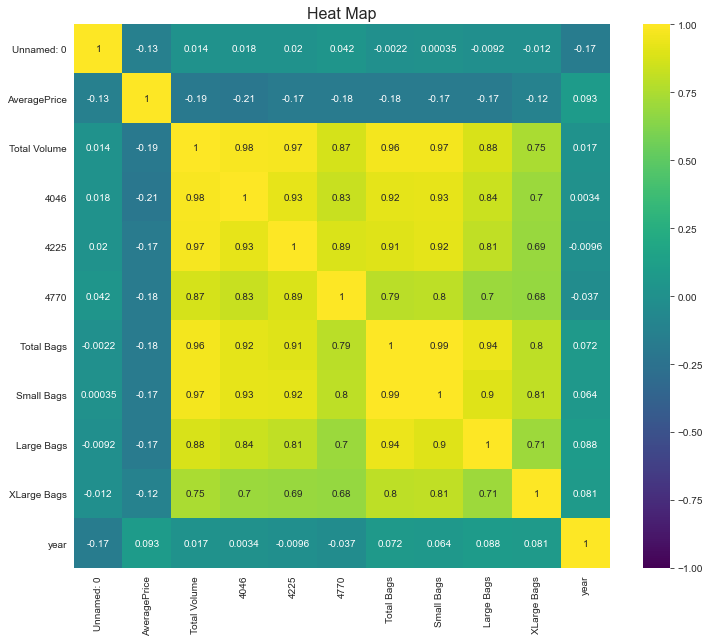

In [53]:
#Heatmap

corr = dt.corr()
corr

f, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 10))
ax.set_title('Heat Map', fontsize=16)

sns.heatmap(corr, vmin=-1, vmax=1, cmap='viridis', annot=True)


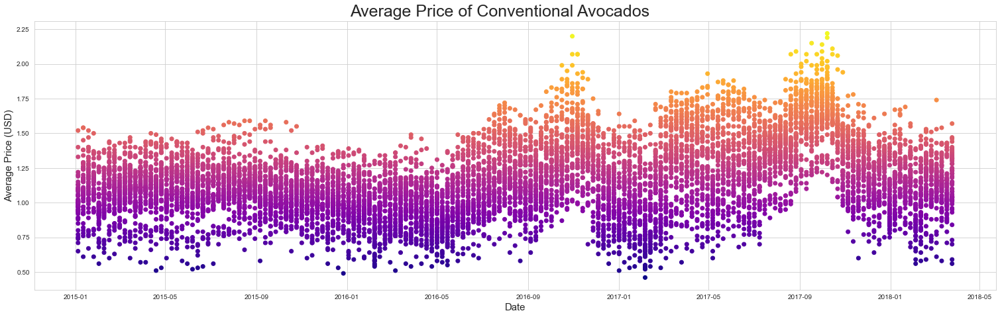

In [54]:
mask = dt['type']== 'conventional'
plt.rc('figure', titlesize=50)
fig = plt.figure(figsize = (26, 7))
fig.suptitle('Average Price of Conventional Avocados', fontsize=25)
ax = fig.add_subplot(111)
fig.subplots_adjust(top=0.93)

dates = dt[mask]['Date'].tolist()
avgPrices = dt[mask]['AveragePrice'].tolist()

plt.scatter(dates, avgPrices, c=avgPrices, cmap='plasma')
ax.set_xlabel('Date',fontsize = 15)
ax.set_ylabel('Average Price (USD)', fontsize = 15)
plt.show()

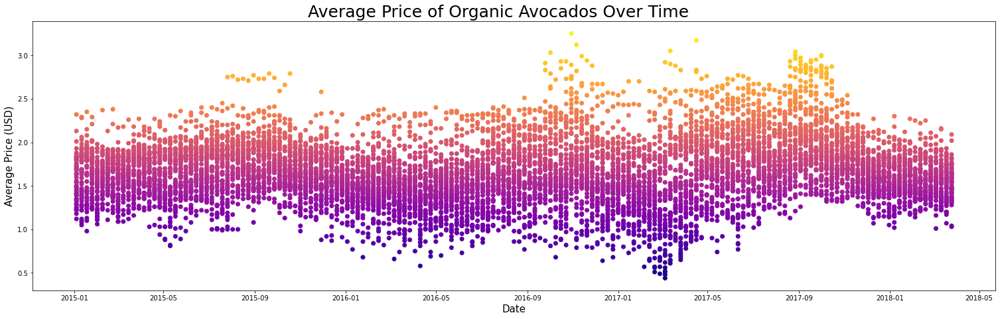

In [13]:
mask = dt['type']== 'organic'
plt.rc('figure', titlesize=50)
fig = plt.figure(figsize = (26, 7))
fig.suptitle('Average Price of Organic Avocados', fontsize=25)
ax = fig.add_subplot(111)
fig.subplots_adjust(top=0.93)

dates = dt[mask]['Date'].tolist()
avgPrices = dt[mask]['AveragePrice'].tolist()

plt.scatter(dates, avgPrices, c=avgPrices, cmap='plasma')
ax.set_xlabel('Date',fontsize = 15)
ax.set_ylabel('Average Price (USD)', fontsize = 15)
plt.show()

In [55]:
print(dt.columns)

dt.loc[dt['type'] == 'conventional','type'] = 0
dt.loc[dt['type'] == 'organic','type'] = 1

dt['type']=pd.to_numeric(dt['type'])


Index(['Unnamed: 0', 'Date', 'AveragePrice', 'Total Volume', '4046', '4225',
       '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags', 'type',
       'year', 'region'],
      dtype='object')


### Machine Learning Model ###

#### 

In [56]:
X = dt.loc[:,['4046', '4225', '4770','Small Bags', 'Large Bags', 'XLarge Bags','type','year','region']]
y = dt.loc[:,'AveragePrice']

#Create the model
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)

#Encode the categorical variables

scaler=LabelEncoder()
for col in X_train.columns:
    if dt[col].dtype=='object':
        X_train[col]=scaler.fit_transform(X_train[col])
        X_test[col]=scaler.transform(X_test[col])

<ipython-input-56-fa263e30b3ff>:12: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-56-fa263e30b3ff>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



In [57]:
linreg = LinearRegression()
linreg.fit(X_train,y_train)
y_tr1 = linreg.predict(X_train)
y_pr = linreg.predict(X_test)

#Calculate MSE
mse = mean_squared_error(y_test,y_pr)
r2 = r2_score(y_test,y_pr)

#R^2
#Accuracy
print('train data accuracy :',linreg.score(X_train,y_train))
print('test data accuracy :',linreg.score(X_test,y_test))


train data accuracy : 0.40540876886124977
test data accuracy : 0.41072629326192


In [58]:
coefficients = pd.DataFrame(linreg.coef_, X.columns)    
coefficients.columns = ['coefficients']
coefficients

,coefficients
4046,-9.033843e-08
4225,1.111804e-07
4770,-4.345671e-07
Small Bags,1.617645e-08
Large Bags,-1.645553e-07
XLarge Bags,1.735204e-06
type,4.874730e-01
year,3.714483e-02
region,2.742592e-04


<ipython-input-59-46657227772e>:15: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-59-46657227772e>:16: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



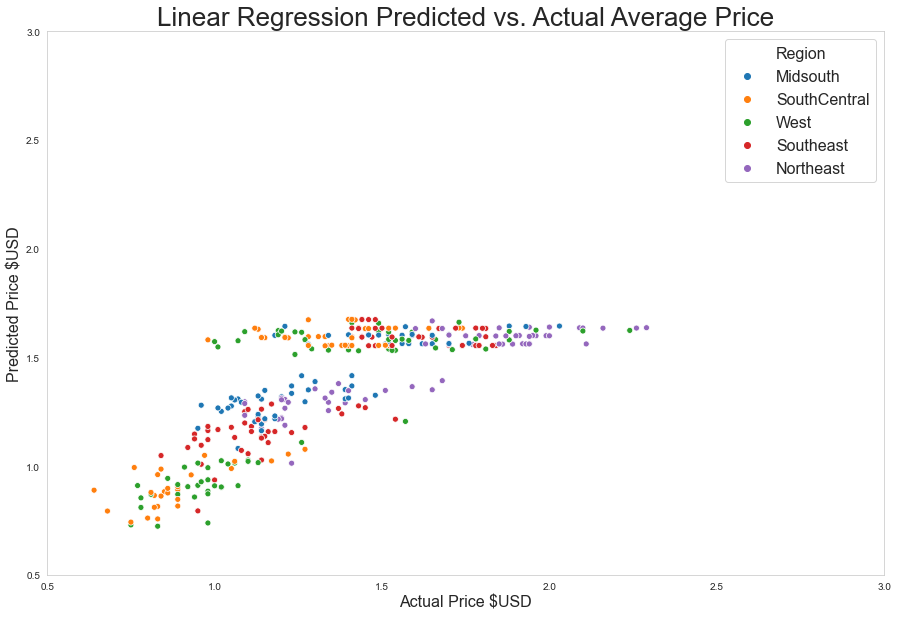

In [59]:
dt_reg=dt.loc[(dt['region']== 'Midsouth') | (dt['region']== 'Northeast') | (dt['region']== 'SouthCentral') | 
              (dt['region']== 'Southeast')| (dt['region']== 'West')]
dt_reg.dtypes

#Split into feature and target datasets
X = dt_reg.loc[:,['4046', '4225', '4770','Small Bags', 'Large Bags', 'XLarge Bags','type','year','region']]
y = dt_reg.loc[:,'AveragePrice']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)

scaler=LabelEncoder()
for col in X_train.columns:
    if dt[col].dtype=='object':
        X_train[col]=scaler.fit_transform(X_train[col])
        X_test[col]=scaler.transform(X_test[col])
        
linreg = LinearRegression()
linreg.fit(X_train,y_train)
y_pr = linreg.predict(X_test)

test=X_test.copy()
test['y']=np.array(y_test)
test['ypred']=y_pr

test.loc[test['type']==0,'avocado_type'] = 'conventional'
test.loc[test['type']== 1,'avocado_type'] = 'organic'
test.loc[test['region']==0,'Region'] = 'Midsouth'
test.loc[test['region']== 1,'Region'] = 'Northeast'
test.loc[test['region']==2,'Region'] = 'SouthCentral'
test.loc[test['region']== 3,'Region'] = 'Southeast'
test.loc[test['region']== 4,'Region'] = 'West'

plt.figure(figsize=(15,10))
y_ypred = sns.scatterplot(y = 'ypred', x = 'y',data=test,hue='Region')#,height=8.27, aspect=11.7/8.27)
y_ypred.set(xlim = (0.5, 3), ylim = (0.5, 3))
plt.xlabel('Actual Price $USD', fontsize = 16)
plt.ylabel('Predicted Price $USD', fontsize = 16)
plt.legend(fontsize = 16)
plt.title('Linear Regression Predicted vs. Actual Average Price', fontsize = 26)
plt.grid()
plt.show()

#### Random Forest ####

In [21]:
X = dt.loc[:,['4046', '4225', '4770','Small Bags', 'Large Bags', 'XLarge Bags','type','year','region']]
y = dt.loc[:,'AveragePrice']

X_train,X_test,y_train,y_test = train_test_split(X,y,test_size = 0.2,random_state = 0)

scaler=LabelEncoder()
for col in X_train.columns:
    if dt[col].dtype=='object':
        X_train[col]=scaler.fit_transform(X_train[col])
        X_test[col]=scaler.transform(X_test[col])

cols=['4046', '4225', '4770','Small Bags', 'Large Bags', 'XLarge Bags','type','year','region']
scaler=StandardScaler()
X_train=scaler.fit_transform(X_train)
X_test=scaler.transform(X_test)

X_train=pd.DataFrame(X_train,columns=cols)
X_train.head()
X_test=pd.DataFrame(X_test,columns=cols)
X_test.head()

clf=RandomForestRegressor(random_state=0)
clf.fit(X_train,y_train)
y_tr1=clf.predict(X_train)
y_pr=clf.predict(X_test)

print('train data accuracy :',clf.score(X_train,y_train))
print('test data accuracy :',clf.score(X_test,y_test))


<ipython-input-21-b388b746ba88>:13: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

<ipython-input-21-b388b746ba88>:14: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



train data accuracy : 0.978523935725235
test data accuracy : 0.846219550526943
loss of train data : 0.0034774291581615184
loss of test data : 0.02504876891780821


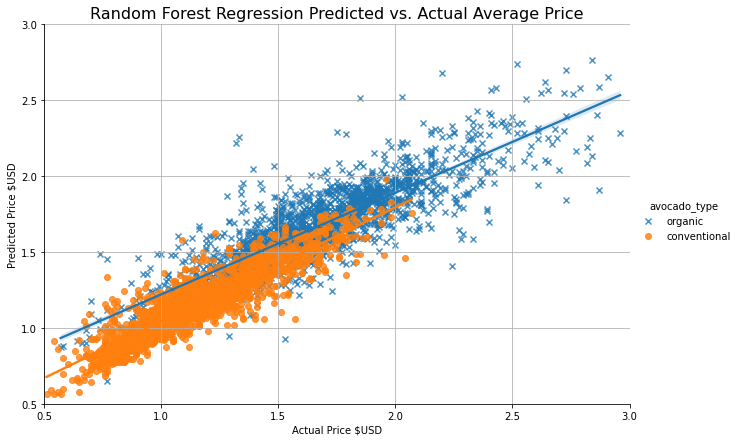

In [23]:
test=X_test.copy()
test['y']=np.array(y_test)
test['ypred']=y_pr

test.loc[test['type']<1,'avocado_type'] = 'conventional'
test.loc[test['type']> 1,'avocado_type'] = 'organic'

y_ypred = sns.lmplot(y = 'ypred', x = 'y', hue = 'avocado_type', data = test, markers=['x', 'o'], height = 6, aspect = 1.5)
y_ypred.set(xlim = (0.5, 3), ylim = (0.5, 3))
plt.xlabel('Actual Price $USD')
plt.ylabel('Predicted Price $USD')
plt.title('Random Forest Regression Predicted vs. Actual Average Price', fontsize = 16)
plt.grid()
plt.show()

#### K-Nearest Neighbour ####

In [24]:
feature_columns = ['AveragePrice', '4046', '4225', '4770', 'Total Bags', 'Small Bags', 'Large Bags', 'XLarge Bags']
X = dt[feature_columns].values
y = dt['type'].values

le = LabelEncoder()
y = le.fit_transform(y)
y

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 0)

# First learning model (k = 3)
classifier = KNeighborsClassifier(n_neighbors=3)

# Fitting the model
classifier.fit(X_train, y_train)

# Predicting the Test set results
y_pred = classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)*100
print('Accuracy of our model is equal to ' + str(round(accuracy, 2)) + '%')

Conf_matrix = confusion_matrix(y_test, y_pred)
print(Conf_matrix)

Accuracy of our model is equal to 97.64%
[[1740   35]
 [  51 1824]]


#### K-Nearest Neighbour Cross Validation ####

<Figure size 432x288 with 0 Axes>

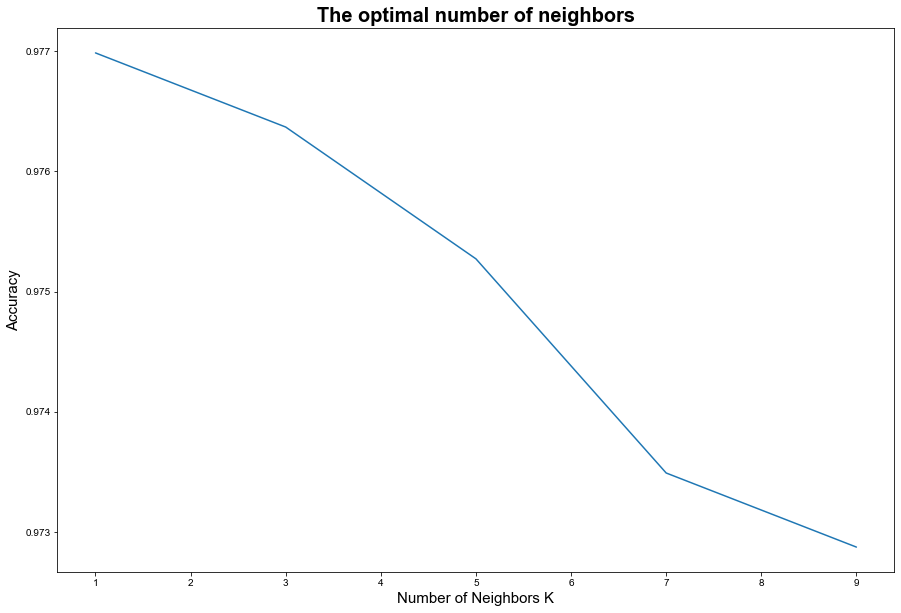

In [25]:
k_list = list(range(1,10,2))

cv_scores = []

# Performing 7-fold cross validation
for k in k_list:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=7, scoring='accuracy')
    cv_scores.append(scores.mean())


# Plotting average Accuracy for all number of neighbors
plt.figure()
plt.figure(figsize=(15,10))
plt.title('The optimal number of neighbors', fontsize=20, fontweight='bold')
plt.xlabel('Number of Neighbors K', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
sns.set_style("whitegrid")

plt.plot(k_list, cv_scores)
plt.show()

In [26]:
dt['Date'] = pd.to_datetime(dt['Date'])
dt['year'] = dt.Date.dt.year
dt['month'] = dt.Date.dt.month

Accuracy of our model is equal to 67.97%
[[960 105  45   7]
 [233 702 176  21]
 [126 255 750  44]
 [  8  34 115  69]]


<Figure size 432x288 with 0 Axes>

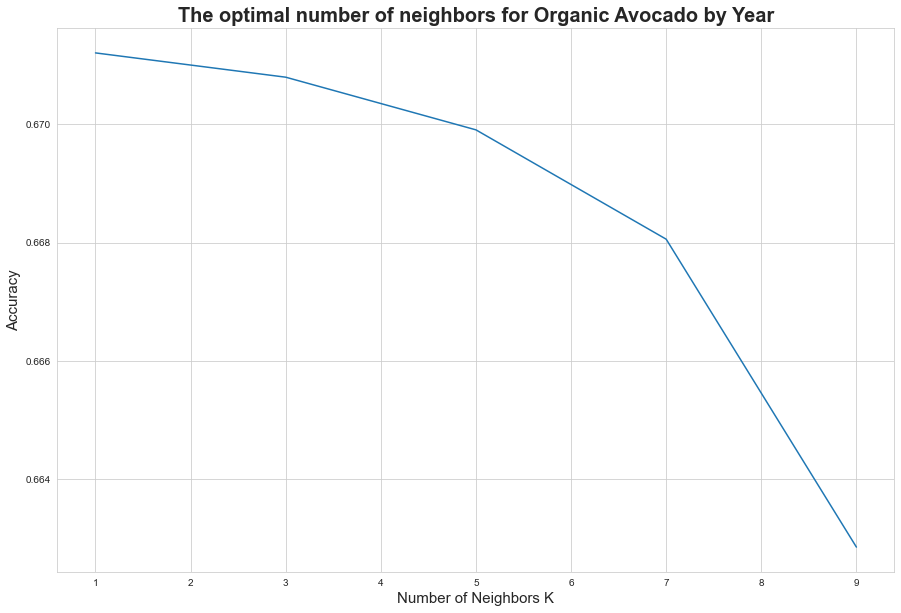

In [27]:
classifier = KNeighborsClassifier(n_neighbors=4)

classifier.fit(X_train, y_train)
y_pred = classifier.predict(X_test)

accuracy = accuracy_score(y_test, y_pred)*100
print('Accuracy of our model is equal to ' + str(round(accuracy, 2)) + '%')

Conf_matrix = confusion_matrix(y_test, y_pred)
print(Conf_matrix)
k_list = list(range(1,10,2))
cv_scores = []

for k in k_list:
    knn = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn, X_train, y_train, cv=7, scoring='accuracy')
    cv_scores.append(scores.mean())
    
plt.figure()
plt.figure(figsize=(15,10))
plt.title('The optimal number of neighbors for Organic Avocado by Year', fontsize=20, fontweight='bold')
plt.xlabel('Number of Neighbors K', fontsize=15)
plt.ylabel('Accuracy', fontsize=15)
sns.set_style("whitegrid")

plt.plot(k_list, cv_scores)
plt.show()

### Real Prediction ###

#### Linear Regression ####

Predicted avicado price in California in 2019 is: 1.916347 USD


<ipython-input-33-a2f40f361a5d>:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



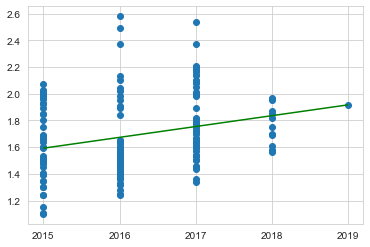

In [33]:
df = pd.read_csv("avocado.csv")
df2 = df[df['region'] == 'California'].drop(['Date','region'], axis=1)
df2 = df2[df['type'] == 'organic']

from scipy import stats

X_lin = df2['year'].reset_index(drop=True)
y_lin = df2['AveragePrice'].reset_index(drop=True)


slope, intercept, r, p, std_err = stats.linregress(X_lin, y_lin) # scipy

def prediction(x):
  return slope * x + intercept

name = 'Avg. Avocado price (organic) in 2019'
md = list(map(prediction, X_lin)) # scipy

X_pred_lin = 2019
y_pred_lin = prediction(X_pred_lin)

print('Predicted avicado price in California in 2019 is: %f USD' % y_pred_lin)

X_lin2 = X_lin.append(pd.Series(X_pred_lin))
y_lin2 = y_lin.append(pd.Series(y_pred_lin))
md2 = list(map(prediction, X_lin2)) 

plt.scatter(X_lin2, y_lin2) # Scatter Plot
plt.plot(X_lin2, md2, color='green')
plt.xticks(np.arange(min(X_lin2), max(X_lin2+1), 1.0))
plt.show()



In [34]:
pip install fbprophet

     |████████████████████████████████| 64 kB 2.2 MB/s eta 0:00:01
     |████████████████████████████████| 37.4 MB 4.7 MB/s eta 0:00:01    |█████▍                          | 6.2 MB 5.2 MB/s eta 0:00:07     |████████████████████████▍       | 28.5 MB 6.5 MB/s eta 0:00:02
     |████████████████████████████████| 45 kB 5.0 MB/s eta 0:00:01
     |████████████████████████████████| 121 kB 8.1 MB/s eta 0:00:01
     |████████████████████████████████| 823 kB 13.1 MB/s eta 0:00:01
     |████████████████████████████████| 5.3 MB 5.7 MB/s eta 0:00:01
  ERROR: Command errored out with exit status 1:
   command: /Users/susie/opt/anaconda3/bin/python -u -c 'import sys, setuptools, tokenize; sys.argv[0] = '"'"'/private/var/folders/y_/s9hg3m3j3r3dxlkyhqkxrq1w0000gn/T/pip-install-tl19kmwm/fbprophet/setup.py'"'"'; __file__='"'"'/private/var/folders/y_/s9hg3m3j3r3dxlkyhqkxrq1w0000gn/T/pip-install-tl19kmwm/fbprophet/setup.py'"'"';f=getattr(tokenize, '"'"'open'"'"', open)(__file__);code=f.read().replace('"'"'\

Note: you may need to restart the kernel to use updated packages.


#### FB Prophet ####

In [36]:
from fbprophet import Prophet 
from fbprophet.plot import add_changepoints_to_plot
df = df[df['region'] == 'California']
df['Date'] = df['Date'].str[:-3] 
df = df[df['type'] == 'organic']
agg = {'AveragePrice': 'mean'}
data = df.groupby(df['Date']).aggregate(agg).reset_index()
data.head()


,Date,AveragePrice
0,2015,1.611346
1,2016,1.613654
2,2017,1.814717
3,2018,1.743333


In [37]:
df_ts = pd.DataFrame() 
df_ts['ds'] = pd.to_datetime(data['Date']) 
df_ts['y'] = data['AveragePrice'] 
df_ts.head()


,ds,y
0,2015-01-01,1.611346
1,2016-01-01,1.613654
2,2017-01-01,1.814717
3,2018-01-01,1.743333


In [38]:
m = Prophet(yearly_seasonality=True, \
            daily_seasonality=False, weekly_seasonality=False) 
m.fit(df_ts)
future = m.make_future_dataframe(periods=12*5, freq='M')


INFO:fbprophet:n_changepoints greater than number of observations. Using 2.


<ipython-input-41-4f310801cb29>:2: UserWarning:

Matplotlib is currently using module://ipykernel.pylab.backend_inline, which is a non-GUI backend, so cannot show the figure.



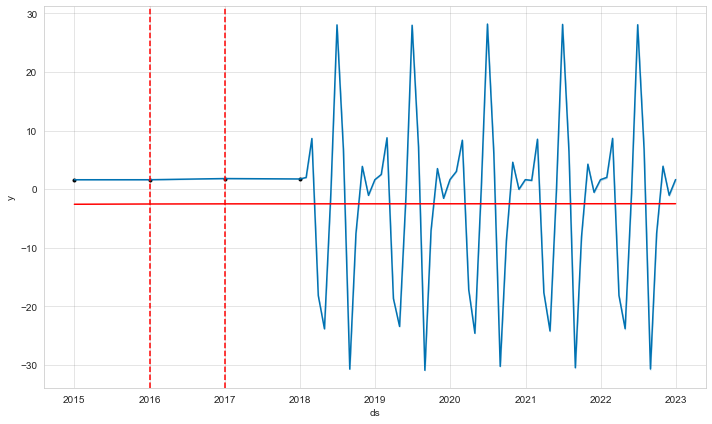

In [41]:
fig = m.plot(forecast) 
fig.show()
a = add_changepoints_to_plot(fig.gca(), m, forecast)

## Thank you! ##